<a href="https://colab.research.google.com/github/Aakash1702/Aakash1702/blob/main/Superhero_Networks_Centrality_%26_Community_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/my_drive')

Mounted at /content/my_drive


In [ ]:
import os
os.environ["KAGGLE_CONFIG_DIR"] = '/content/my_drive/MyDrive/kaggle/marveldata'


In [ ]:
%cd /content/my_drive/MyDrive/kaggle/marveldata


/content/my_drive/MyDrive/kaggle/marveldata


In [ ]:
!kaggle datasets download -d csanhueza/the-marvel-universe-social-network


Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 403, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /content/my_drive/MyDrive/kaggle/marveldata. Or use the environment method.


In [ ]:
!unzip the-marvel-universe-social-network.zip -d marveldata

unzip:  cannot find or open the-marvel-universe-social-network.zip, the-marvel-universe-social-network.zip.zip or the-marvel-universe-social-network.zip.ZIP.


In [ ]:
import pandas as pd
df = pd.read_csv("edges.csv", nrows= 100)
df.head()

,hero,comic
0,24-HOUR MAN/EMMANUEL,AA2 35
1,3-D MAN/CHARLES CHAN,AVF 4
2,3-D MAN/CHARLES CHAN,AVF 5
3,3-D MAN/CHARLES CHAN,COC 1
4,3-D MAN/CHARLES CHAN,H2 251


In [ ]:
import pandas as pd
df = pd.read_csv("hero-network.csv", nrows= 100)
df.head()

,hero1,hero2
0,"LITTLE, ABNER",PRINCESS ZANDA
1,"LITTLE, ABNER",BLACK PANTHER/T'CHAL
2,BLACK PANTHER/T'CHAL,PRINCESS ZANDA
3,"LITTLE, ABNER",PRINCESS ZANDA
4,"LITTLE, ABNER",BLACK PANTHER/T'CHAL


In [ ]:
import pandas as pd
df = pd.read_csv("nodes.csv", nrows=100)
df.head()

,node,type
0,2001 10,comic
1,2001 8,comic
2,2001 9,comic
3,24-HOUR MAN/EMMANUEL,hero
4,3-D MAN/CHARLES CHAN,hero


In [ ]:
import networkx as nx

G = nx.Graph()  # Create an empty undirected graph


In [ ]:
import pandas as pd

# Load your dataset into the 'data' variable
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')


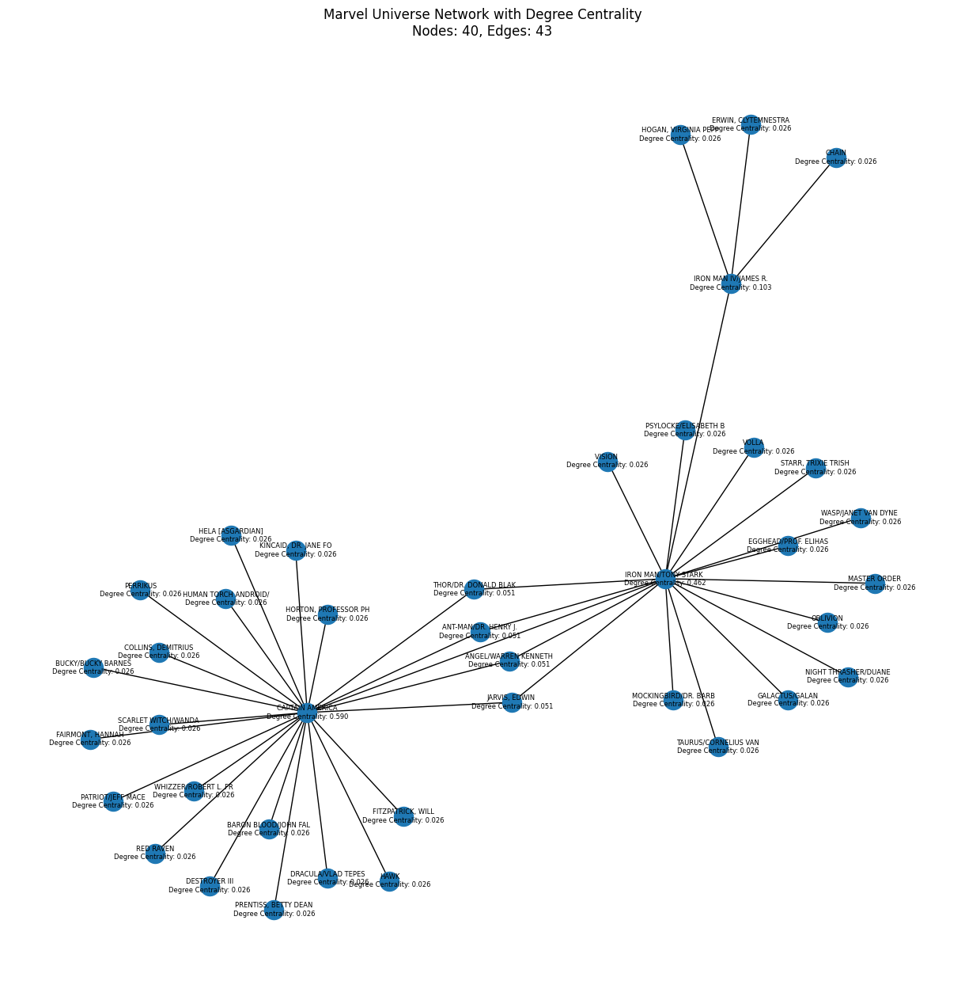

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load data
hero_network = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv',nrows=6000)

# Initialize DataFrames for each hero
Thor = pd.DataFrame()
Cap = pd.DataFrame()
IronMan = pd.DataFrame()
Hulk = pd.DataFrame()
Spiderman = pd.DataFrame()

# Filter and sample Thor
Thor_df = hero_network[hero_network['hero1'] == 'THOR']
if not Thor_df.empty:
    Thor = Thor_df.sample(min(25, len(Thor_df)))

# Filter and sample Captain America
Cap_df = hero_network[hero_network['hero1'] == 'CAPTAIN AMERICA']
if not Cap_df.empty:
    Cap = Cap_df.sample(min(25, len(Cap_df)))

# Filter and sample Iron Man
IronMan_df = hero_network[hero_network['hero1'].str.contains('IRON MAN')]
if not IronMan_df.empty:
    IronMan = IronMan_df.sample(min(25, len(IronMan_df)))

# Filter and sample Hulk
Hulk_df = hero_network[hero_network['hero1'] == 'HULK']
if not Hulk_df.empty:
    Hulk = Hulk_df.sample(min(25, len(Hulk_df)))

# Filter and sample Spiderman
Spidey_df = hero_network[hero_network['hero1'] == 'SPIDER-MAN']
if not Spidey_df.empty:
    Spiderman = Spidey_df.sample(min(25, len(Spidey_df)))

# Concatenate subsets
Subset = pd.concat([Thor, Cap, IronMan, Hulk, Spiderman], axis=0)

# Create graph
G = nx.from_pandas_edgelist(Subset, 'hero1', 'hero2')

# Set the spring layout
k_value = 0.3  # You can adjust this value to control the spacing
pos = nx.spring_layout(G, k=k_value)

# Compute degree centrality for each node
degree_centrality = nx.degree_centrality(G)

# Create a dictionary of node labels including the degree centrality
node_labels = {node: f"{node}\nDegree Centrality: {degree_centrality[node]:.3f}" for node in G.nodes()}

# Get the total number of nodes and edges
total_nodes = G.number_of_nodes()
total_edges = G.number_of_edges()

# Adjust font size for node labels
font_size = 6  # You can change this to your desired font size

# Draw nodes with labels and custom font size
plt.figure(figsize=(12, 12))
nx.draw(G, pos, with_labels=True, labels=node_labels, font_size=font_size)
plt.title(f"Marvel Universe Network with Degree Centrality\nNodes: {total_nodes}, Edges: {total_edges}")
plt.show()


In [ ]:
# Calculate statistical parameters
arithmetic_stats = data.describe()
print("Arithmetic Statistical Parameters:\n", arithmetic_stats)


Arithmetic Statistical Parameters:
                   hero1            hero2
count            574467           574467
unique             6211             6173
top     CAPTAIN AMERICA  CAPTAIN AMERICA
freq               8149             8350


In [ ]:
import pandas as pd

# Load your dataset into the 'data' variable
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')  # Replace 'your_dataset.csv' with your actual file path

# Check the column names in your DataFrame
print(data.columns)

Index(['hero1', 'hero2'], dtype='object')


In [ ]:
# Calculate statistical parameters
degree_stats = data['hero1'].value_counts().describe()

# Print statistical parameters
print("Degree Statistical Parameters:\n", degree_stats)

# Top 15 nodes by degree
top_nodes = data['hero1'].value_counts().head(15)
print("\nTop 15 nodes by degree:\n", top_nodes)


Degree Statistical Parameters:
 count    6211.000000
mean       92.491869
std       367.084978
min         1.000000
25%         7.000000
50%        18.000000
75%        53.000000
max      8149.000000
Name: hero1, dtype: float64

Top 15 nodes by degree:
 CAPTAIN AMERICA         8149
SPIDER-MAN/PETER PAR    6652
IRON MAN/TONY STARK     5850
THOR/DR. DONALD BLAK    5712
THING/BENJAMIN J. GR    5369
WOLVERINE/LOGAN         5230
SCARLET WITCH/WANDA     5184
VISION                  5067
HUMAN TORCH/JOHNNY S    4970
MR. FANTASTIC/REED R    4788
INVISIBLE WOMAN/SUE     4723
BEAST/HENRY &HANK& P    4628
HAWK                    4506
CYCLOPS/SCOTT SUMMER    4492
WASP/JANET VAN DYNE     4452
Name: hero1, dtype: int64


In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)
print("Degree Centrality:")
for node, centrality in degree_centrality.items():
    print(f"{node}: {centrality}")

Degree Centrality:
LITTLE, ABNER: 0.006410256410256411
PRINCESS ZANDA: 0.006410256410256411
BLACK PANTHER/T'CHAL: 0.11324786324786326
STEELE, SIMON/WOLFGA: 0.010683760683760684
FORTUNE, DOMINIC: 0.010683760683760684
ERWIN, CLYTEMNESTRA: 0.03418803418803419
IRON MAN/TONY STARK : 0.22222222222222224
IRON MAN IV/JAMES R.: 0.06837606837606838
RAVEN, SABBATH II/EL: 0.010683760683760684
CARNIVORE/COUNT ANDR: 0.006410256410256411
GHOST: 0.006410256410256411
ZIMMER, ABE: 0.006410256410256411
FU MANCHU: 0.008547008547008548
TARR, BLACK JACK: 0.021367521367521368
SMITH, SIR DENIS NAY: 0.021367521367521368
SHANG-CHI: 0.021367521367521368
STARSHINE II/BRANDY : 0.047008547008547015
ROM, SPACEKNIGHT: 0.05555555555555556
MAN-THING/THEODORE T: 0.008547008547008548
WU, LEIKO: 0.017094017094017096
DOCTOR DREDD: 0.017094017094017096
RESTON, CLIVE: 0.017094017094017096
JACKSON, STEVE: 0.042735042735042736
MYSTIQUE/RAVEN DARKH: 0.02991452991452992
BLOB/FRED J. DUKES: 0.03632478632478633
TORPEDO III/BROCK J

In [ ]:
# Detect communities (e.g., using Louvain method)
communities = nx.community.greedy_modularity_communities(G)
print("Communities:")
for i, community in enumerate(communities):
    print(f"Community {i + 1}: {list(community)}")


Communities:
Community 1: ['PLANTMAN/SAM SMITHER', 'EGGHEAD/PROF. ELIHAS', 'LEO/DANIEL RADFORD', 'UNUS THE UNTOUCHABLE', 'GHOST RIDER III/DAN ', 'FURY, COL. NICHOLAS ', 'BANSHEE/SEAN CASSIDY', 'TIGRA/GREER NELSON', 'LUCIFER', 'CARPENTER, LARRY', 'ICEMAN/ROBERT BOBBY ', 'CAPRICORN/WILLARD WE', 'JOCASTA', 'UATU', 'AQUARIUS II/', 'HUMAN TORCH/JOHNNY S', 'SANDMAN/WILLIAM BAKE', 'GEMINI/JOSHUA LINK', 'INTERLOPER', 'ROBERTS, TED', 'SOUTHERN, CANDY', 'RADIOACTIVE MAN/DR. ', 'BATROC/GEORGES BATRO', 'MIMIC/CALVIN RANKIN', 'RICHARDS, FRANKLIN B', 'PEREGRINE, LE/FRANCK', 'LIVING LASER/ARTHUR ', 'PROFESSOR X/CHARLES ', 'MACHETE/FERDINAND LO', 'NORRISS, SISTER BARB', 'DRAGON OF THE MOON', 'SILVER SABLE', 'RAMON', 'EL TIGRE', 'STANKOWICZ, FABIAN', 'FORTUNE, DOMINIC', 'IRON MAN/TONY STARK ', 'CYCLOPS/SCOTT SUMMER', 'GARGOYLE II/ISAAC CH', 'FREDERICKS, GENERAL', 'ZANIAC/BRAD WOLFE', 'DEATHLOK III/MICHAEL', 'CLEMSON, MIKE', 'OBLIVION', 'CLOUD', 'ZELDA', 'PUPPET MASTER/PHILLI', 'STAR THIEF II', 'DEATH',

In [ ]:


# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality for each node
degree_centrality = nx.degree_centrality(G)

# Sort nodes based on degree centrality in descending order
sorted_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)

# Get the top n nodes based on degree centrality
top_n = 10  # Change this number to get a different number of top nodes
top_nodes = sorted_nodes[:top_n]

print(f"Top {top_n} nodes based on degree centrality:")
for node in top_nodes:
    print(f"{node}: Degree Centrality = {degree_centrality[node]}")


Top 10 nodes based on degree centrality:
CAPTAIN AMERICA: Degree Centrality = 0.2969649805447471
SPIDER-MAN/PETER PAR: Degree Centrality = 0.2703501945525292
IRON MAN/TONY STARK : Degree Centrality = 0.23688715953307396
THING/BENJAMIN J. GR: Degree Centrality = 0.2203891050583658
MR. FANTASTIC/REED R: Degree Centrality = 0.21463035019455254
WOLVERINE/LOGAN : Degree Centrality = 0.21338521400778213
HUMAN TORCH/JOHNNY S: Degree Centrality = 0.21182879377431907
SCARLET WITCH/WANDA : Degree Centrality = 0.20622568093385216
THOR/DR. DONALD BLAK: Degree Centrality = 0.20062256809338522
BEAST/HENRY &HANK& P: Degree Centrality = 0.19719844357976654


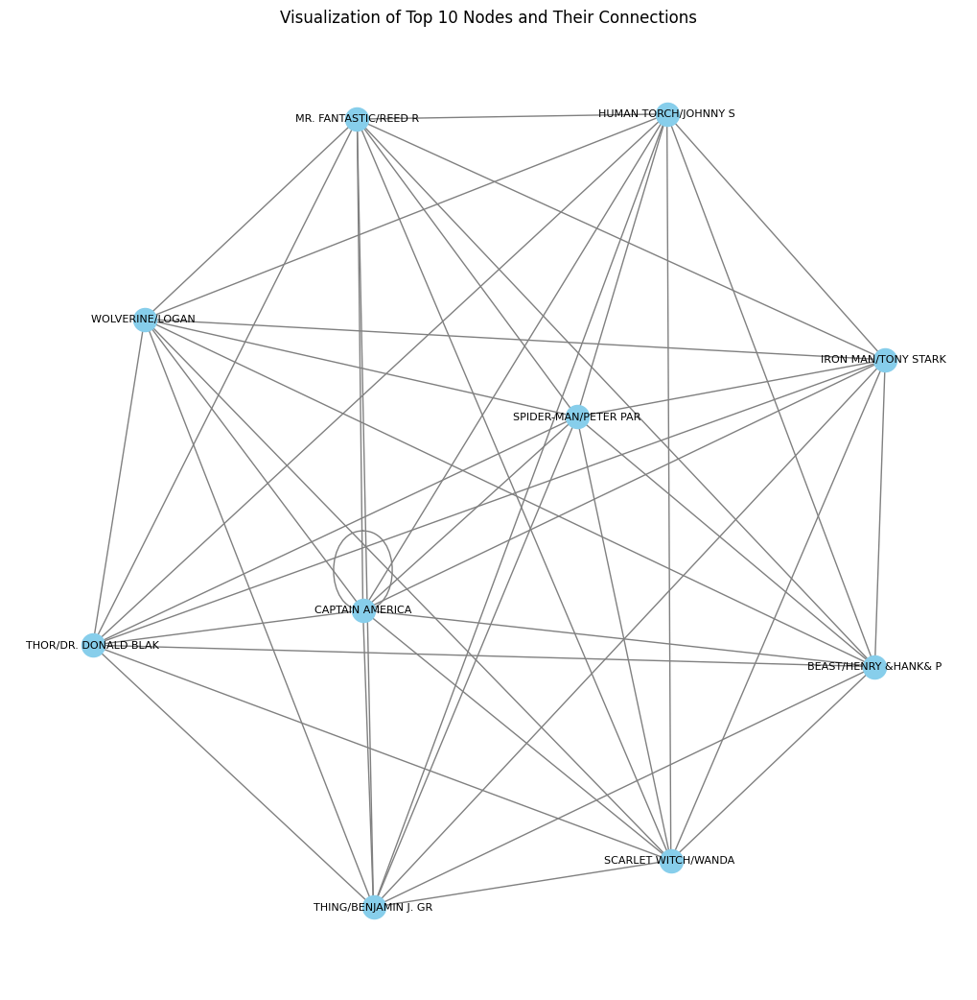

In [ ]:

import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality for each node
degree_centrality = nx.degree_centrality(G)

# Sort nodes based on degree centrality in descending order
sorted_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)

# Get the top n nodes based on degree centrality
top_n = 10  # Change this number to get a different number of top nodes
top_nodes = sorted_nodes[:top_n]

# Create a subgraph with top nodes and their immediate connections
top_subgraph = G.subgraph(top_nodes)

# Visualize the subgraph of top nodes
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(top_subgraph, seed=42)
nx.draw(top_subgraph, pos, with_labels=True, node_size=300, node_color='skyblue', edge_color='gray', font_size=8)
plt.title(f"Visualization of Top {top_n} Nodes and Their Connections")
plt.show()


In [ ]:

# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=4000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Sort nodes based on betweenness centrality in descending order
sorted_nodes = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)

# Get top n nodes based on betweenness centrality
top_n = 10
top_nodes = sorted_nodes[:top_n]

# Extract the connections between the top nodes
connections = []
for node1 in top_nodes:
    for node2 in top_nodes:
        if node1 != node2 and nx.has_path(G, node1, node2):
            path = nx.shortest_path(G, node1, node2)
            connections.append(path)

# Print connections between the top nodes
for connection in connections:
    print(f"Connection: {connection}")


Connection: ['SPIDER-MAN/PETER PAR', 'CYCLOPS/SCOTT SUMMER', 'ROGUE /']
Connection: ['SPIDER-MAN/PETER PAR', 'HULK/DR. ROBERT BRUC']
Connection: ['SPIDER-MAN/PETER PAR', 'CYCLOPS/SCOTT SUMMER']
Connection: ['SPIDER-MAN/PETER PAR', 'SPEEDBALL/ROBBIE BAL', 'IRON MAN/TONY STARK ']
Connection: ['SPIDER-MAN/PETER PAR', 'ICEMAN/ROBERT BOBBY ']
Connection: ['SPIDER-MAN/PETER PAR', 'CYCLOPS/SCOTT SUMMER', 'DAZZLER II/ALLISON B']
Connection: ['SPIDER-MAN/PETER PAR', 'ICEMAN/ROBERT BOBBY ', 'HAWK']
Connection: ['SPIDER-MAN/PETER PAR', 'THOR/DR. DONALD BLAK']
Connection: ['SPIDER-MAN/PETER PAR', 'ICEMAN/ROBERT BOBBY ', 'SUMMERS, NATHAN CHRI']
Connection: ['ROGUE /', 'CYCLOPS/SCOTT SUMMER', 'SPIDER-MAN/PETER PAR']
Connection: ['ROGUE /', 'CYCLOPS/SCOTT SUMMER', 'HULK/DR. ROBERT BRUC']
Connection: ['ROGUE /', 'CYCLOPS/SCOTT SUMMER']
Connection: ['ROGUE /', 'CYCLOPS/SCOTT SUMMER', 'IRON MAN/TONY STARK ']
Connection: ['ROGUE /', 'DAZZLER II/ALLISON B', 'ICEMAN/ROBERT BOBBY ']
Connection: ['ROGUE /', 

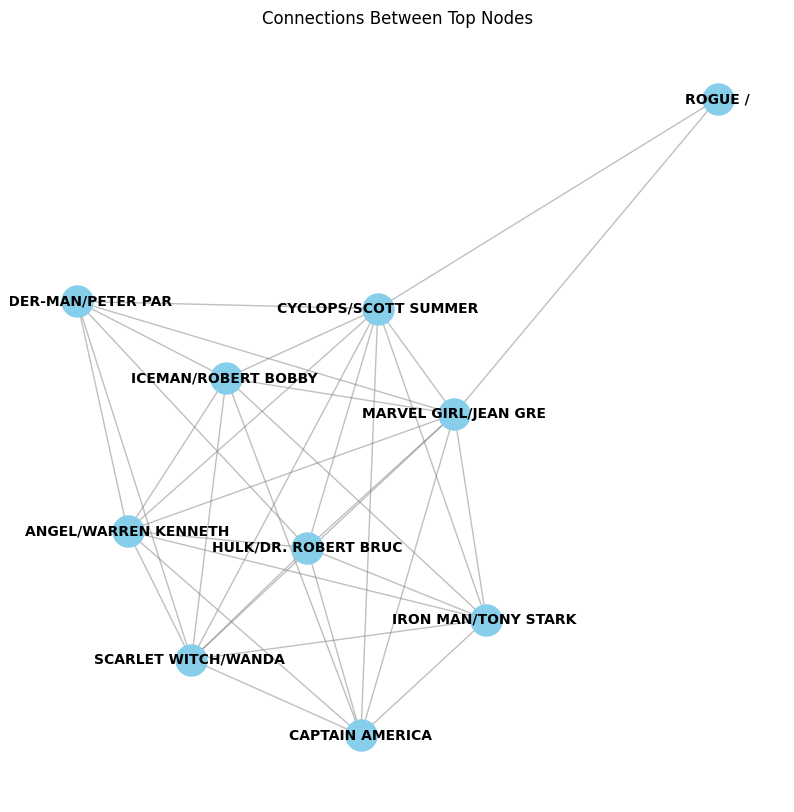

In [ ]:

# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=6000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Sort nodes based on betweenness centrality in descending order
sorted_nodes = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)

# Get top n nodes based on betweenness centrality
top_n = 10  # Change this number to get a different number of top nodes
top_nodes = sorted_nodes[:top_n]

# Create a subgraph with the top nodes and their connections
top_subgraph = G.subgraph(top_nodes)
pos = nx.spring_layout(top_subgraph, seed=42)

# Draw the graph
plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(top_subgraph, pos, node_size=500, node_color='skyblue')
nx.draw_networkx_edges(top_subgraph, pos, width=1.0, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(top_subgraph, pos, font_size=10, font_color='black', font_weight='bold')
plt.title('Connections Between Top Nodes')
plt.axis('off')
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=6000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Sort nodes based on betweenness centrality in descending order
sorted_nodes = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)

# Get top n nodes based on betweenness centrality
top_n = 10  # Change this number to get a different number of top nodes
top_nodes = sorted_nodes[:top_n]

# Print the top 10 nodes based on betweenness centrality
print("Top 10 nodes based on Betweenness Centrality:")
for i, node in enumerate(top_nodes, start=1):
    print(f"{i}. {node}: {betweenness_centrality[node]}")


Top 10 nodes based on Betweenness Centrality:
1. SPIDER-MAN/PETER PAR: 0.1589102452586534
2. IRON MAN/TONY STARK : 0.13602364028107533
3. CAPTAIN AMERICA: 0.11807639960067204
4. HULK/DR. ROBERT BRUC: 0.0913262436626546
5. SCARLET WITCH/WANDA : 0.07557184836542885
6. CYCLOPS/SCOTT SUMMER: 0.0732687517747985
7. ICEMAN/ROBERT BOBBY : 0.0672334877520488
8. ROGUE /: 0.05211228981333479
9. ANGEL/WARREN KENNETH: 0.048270763959407686
10. MARVEL GIRL/JEAN GRE: 0.04519466545238993


<ipython-input-25-25d859ee9746>:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Betweenness Centrality')


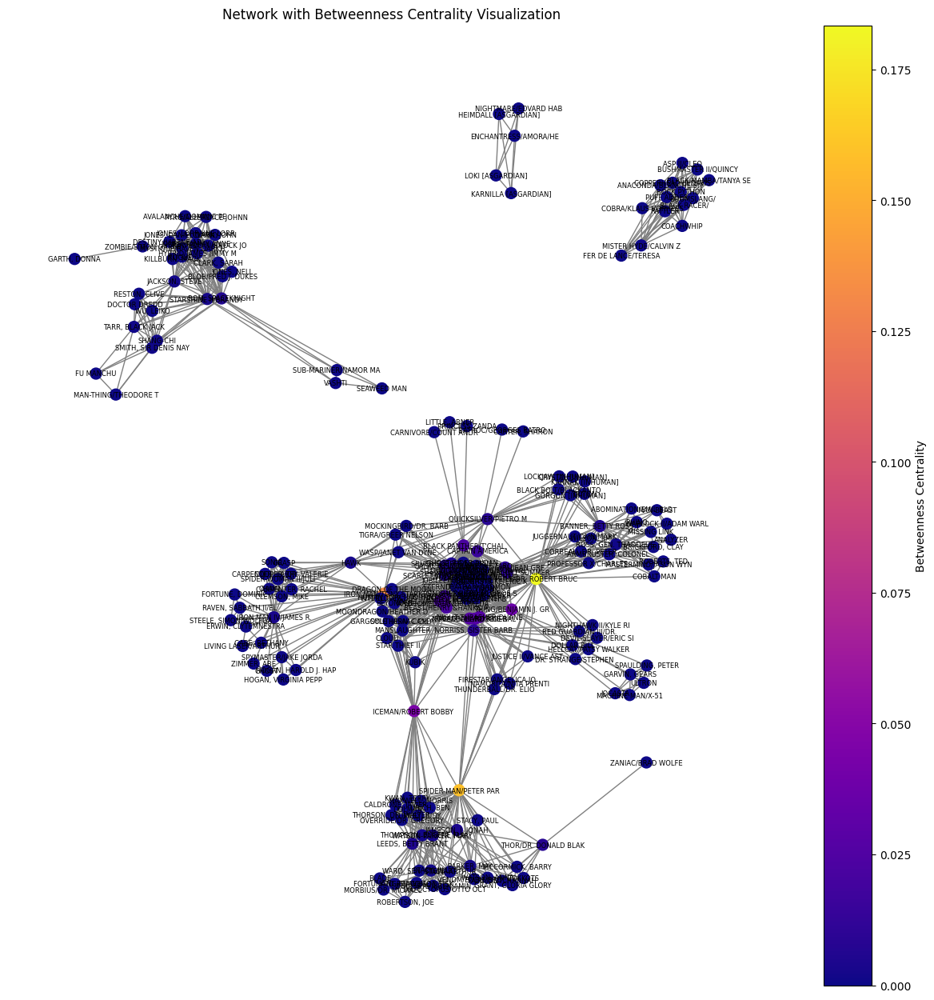

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows = 2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Create a colormap for nodes based on betweenness centrality
node_colors = [betweenness_centrality[node] for node in G.nodes()]
cmap = plt.cm.plasma

# Draw the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42,  k= 0.2)
nx.draw(G, pos, labels={node: node for node in G.nodes()}, font_size=6, node_color=node_colors, cmap=cmap, node_size=100, edge_color='gray', alpha=1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(min(node_colors), max(node_colors)))
sm.set_array([])
plt.colorbar(sm, label='Betweenness Centrality')
plt.title('Network with Betweenness Centrality Visualization')
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv',nrows=1000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Display nodes and their betweenness centrality values
for node, bc_value in betweenness_centrality.items():
    print(f"Node: {node}, Betweenness Centrality: {bc_value:.4f}")


Node: LITTLE, ABNER, Betweenness Centrality: 0.0000
Node: PRINCESS ZANDA, Betweenness Centrality: 0.0000
Node: BLACK PANTHER/T'CHAL, Betweenness Centrality: 0.0471
Node: STEELE, SIMON/WOLFGA, Betweenness Centrality: 0.0000
Node: FORTUNE, DOMINIC, Betweenness Centrality: 0.0000
Node: ERWIN, CLYTEMNESTRA, Betweenness Centrality: 0.0000
Node: IRON MAN/TONY STARK , Betweenness Centrality: 0.1145
Node: IRON MAN IV/JAMES R., Betweenness Centrality: 0.0011
Node: RAVEN, SABBATH II/EL, Betweenness Centrality: 0.0000
Node: CARNIVORE/COUNT ANDR, Betweenness Centrality: 0.0000
Node: GHOST, Betweenness Centrality: 0.0000
Node: ZIMMER, ABE, Betweenness Centrality: 0.0000
Node: FU MANCHU, Betweenness Centrality: 0.0000
Node: TARR, BLACK JACK, Betweenness Centrality: 0.0044
Node: SMITH, SIR DENIS NAY, Betweenness Centrality: 0.0044
Node: SHANG-CHI, Betweenness Centrality: 0.0044
Node: STARSHINE II/BRANDY , Betweenness Centrality: 0.0148
Node: ROM, SPACEKNIGHT, Betweenness Centrality: 0.0313
Node: MAN-

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=1000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate closeness centrality for each node
closeness_centrality = nx.closeness_centrality(G)

# Display nodes and their closeness centrality values
for node, cc_value in closeness_centrality.items():
    print(f"Node: {node}, Closeness Centrality: {cc_value:.4f}")


Node: LITTLE, ABNER, Closeness Centrality: 0.2951
Node: PRINCESS ZANDA, Closeness Centrality: 0.2951
Node: BLACK PANTHER/T'CHAL, Closeness Centrality: 0.5105
Node: STEELE, SIMON/WOLFGA, Closeness Centrality: 0.3229
Node: FORTUNE, DOMINIC, Closeness Centrality: 0.3229
Node: ERWIN, CLYTEMNESTRA, Closeness Centrality: 0.3229
Node: IRON MAN/TONY STARK , Closeness Centrality: 0.5812
Node: IRON MAN IV/JAMES R., Closeness Centrality: 0.3285
Node: RAVEN, SABBATH II/EL, Closeness Centrality: 0.3229
Node: CARNIVORE/COUNT ANDR, Closeness Centrality: 0.2951
Node: GHOST, Closeness Centrality: 0.3175
Node: ZIMMER, ABE, Closeness Centrality: 0.3175
Node: FU MANCHU, Closeness Centrality: 0.1302
Node: TARR, BLACK JACK, Closeness Centrality: 0.1982
Node: SMITH, SIR DENIS NAY, Closeness Centrality: 0.1982
Node: SHANG-CHI, Closeness Centrality: 0.1982
Node: STARSHINE II/BRANDY , Closeness Centrality: 0.2681
Node: ROM, SPACEKNIGHT, Closeness Centrality: 0.3039
Node: MAN-THING/THEODORE T, Closeness Centrali

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


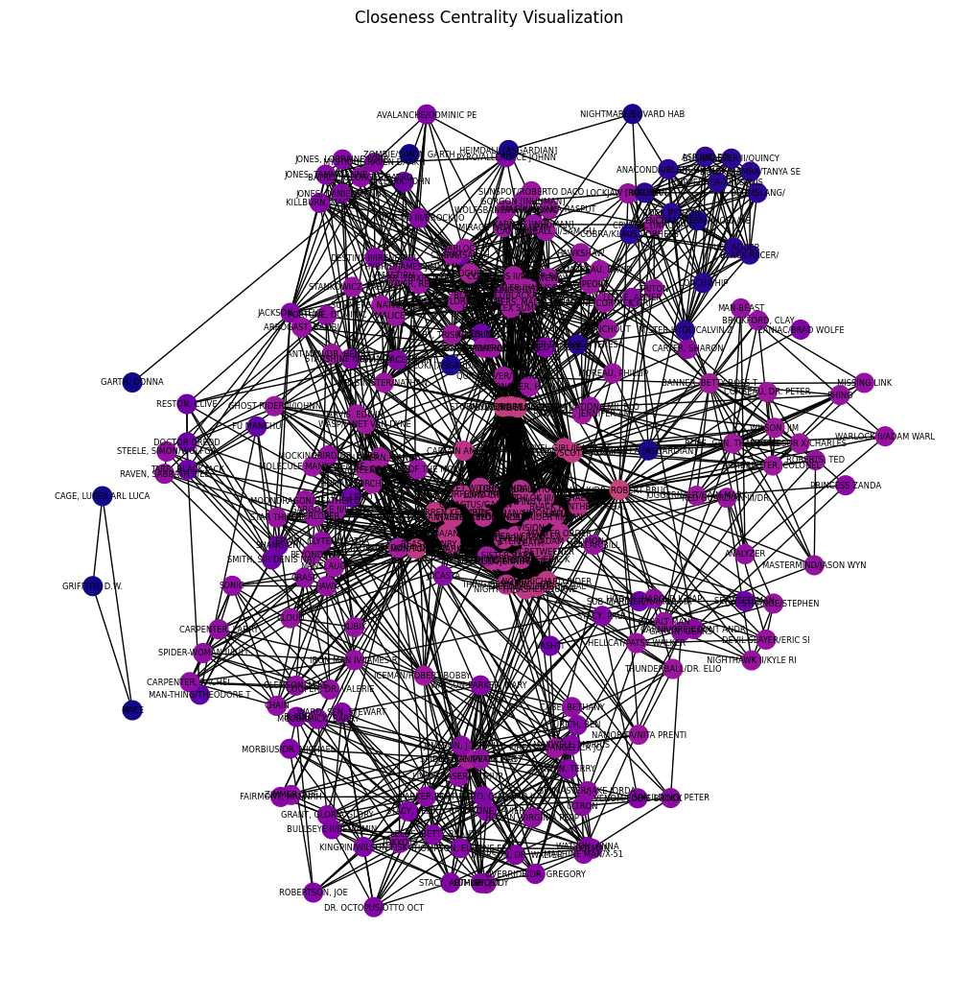

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate closeness centrality for each node
closeness_centrality = nx.closeness_centrality(G)

# Create a colormap for node colors
colormap = plt.get_cmap('plasma')
node_colors = [colormap(closeness_centrality[node]) for node in G.nodes()]

# Visualize the graph with node colors representing closeness centrality
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, seed=42, k=0.500)
nx.draw(G, pos, with_labels=True, font_size=6, node_color=node_colors, node_size=200, cmap='plasma')
plt.title("Closeness Centrality Visualization")
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=7000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)

# Get the most influential nodes based on each centrality measure
most_influential_degree = max(degree_centrality, key=degree_centrality.get)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print(f"Most Influential Node (Degree Centrality): {most_influential_degree}")
print(f"Most Influential Node (Betweenness Centrality): {most_influential_betweenness}")
print(f"Most Influential Node (Closeness Centrality): {most_influential_closeness}")


Most Influential Node (Degree Centrality): IRON MAN/TONY STARK 
Most Influential Node (Betweenness Centrality): SPIDER-MAN/PETER PAR
Most Influential Node (Closeness Centrality): BEAST/HENRY &HANK& P


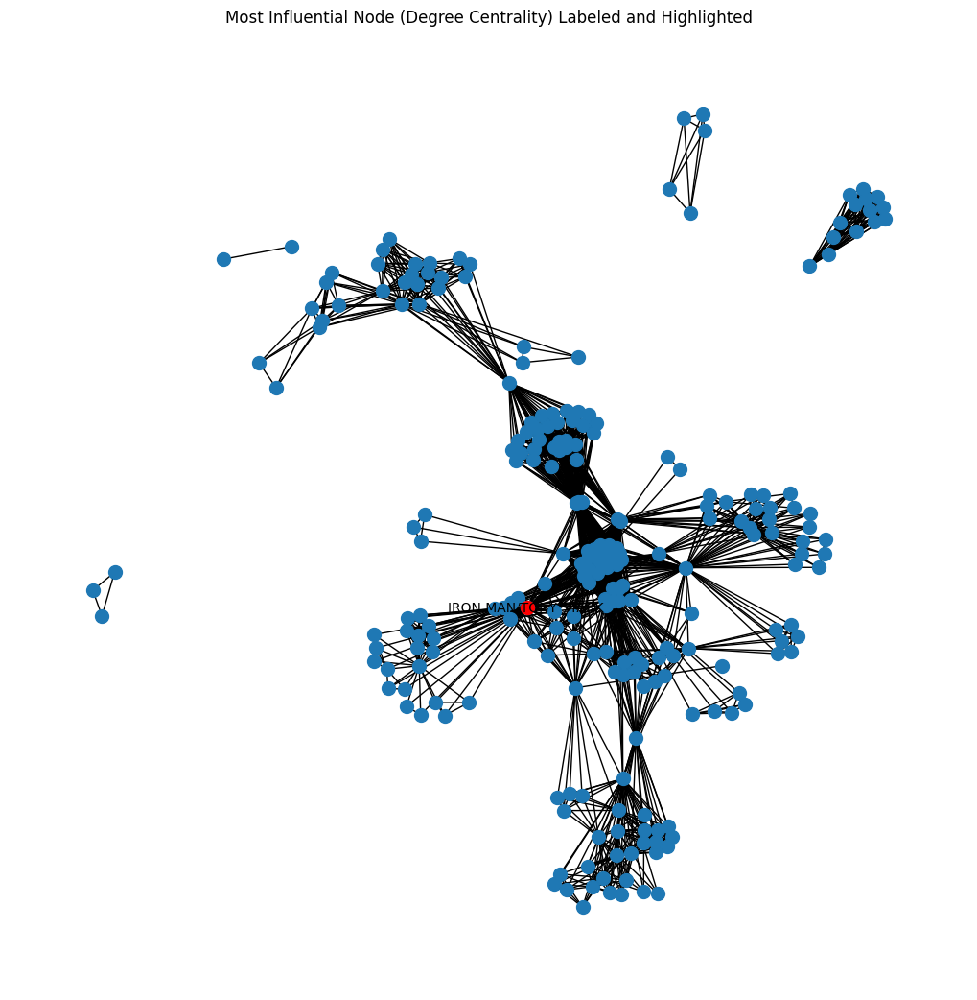

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Get the most influential node based on degree centrality
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

# Draw the graph with only the most influential node labeled and in red color
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, seed=42, k=0.2)  # Adjust the 'k' value for more space between nodes

# Draw nodes and edges
nx.draw(G, pos, with_labels=False, node_size=100)
nx.draw_networkx_labels(G, pos, labels={most_influential_degree: most_influential_degree}, font_size=10)

# Highlight the most influential node in red color
nx.draw_networkx_nodes(G, pos, nodelist=[most_influential_degree], node_color='red', node_size=100)

plt.title("Most Influential Node (Degree Centrality) Labeled and Highlighted")
plt.show()


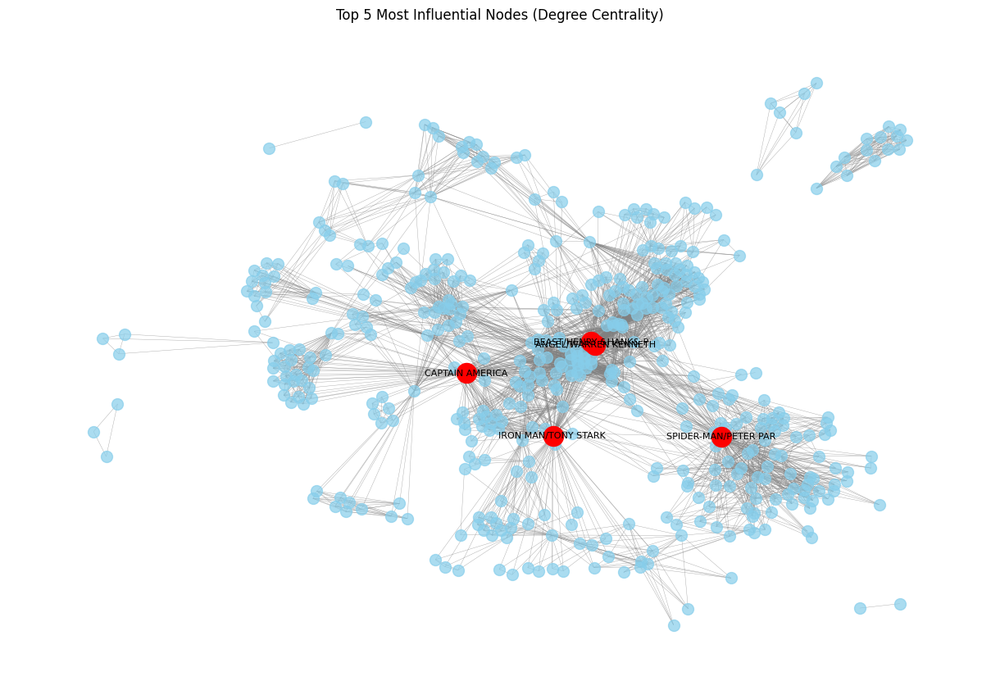

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=6000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Get the top 'n' most influential nodes based on degree centrality
n = 5  # Change this value to get the top 'n' nodes
most_influential_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:n]

# Draw the graph highlighting the top 'n' most influential nodes
plt.figure(figsize=(12, 8))

# Choose a layout algorithm
pos = nx.spring_layout(G, seed=42, k=0.2)

# Draw nodes and edges with customized features
nx.draw(G, pos, with_labels=False, node_size=100, node_color='skyblue', alpha=0.7, edge_color='gray', width=0.3)

# Highlight the top 'n' most influential nodes in red color and larger size
nx.draw_networkx_nodes(G, pos, nodelist=most_influential_nodes, node_color='red', node_size=300)

# Label the top 'n' most influential nodes
labels = {node: node for node in most_influential_nodes}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)

plt.title(f"Top {n} Most Influential Nodes (Degree Centrality)")
plt.show()


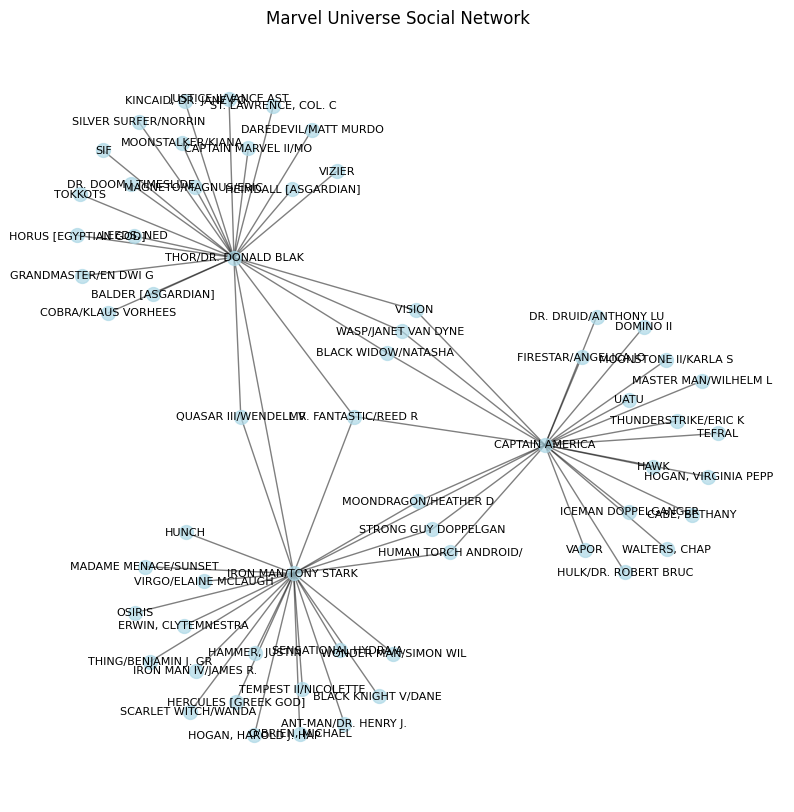

In [ ]:
# Load the hero network data
hero_network = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')

# Create a subset of data for Thor, Captain America, and Iron Man
Thor = hero_network[hero_network['hero1'] == 'THOR/DR. DONALD BLAK'].sample(25)
Cap = hero_network[hero_network['hero1'] == 'CAPTAIN AMERICA'].sample(25)
IronMan = hero_network[hero_network['hero1'].str.contains('IRON MAN/TONY STARK')].sample(25)

Subset = pd.concat([Thor, Cap, IronMan], axis=0)

# Create a NetworkX graph from the subset
G = nx.from_pandas_edgelist(Subset, 'hero1', 'hero2')

# Set the figure size
plt.figure(figsize=(10, 10))

# Customize the layout and appearance of the graph
pos = nx.spring_layout(G, k=0.15, iterations=50, seed=42)
node_labels = {node: node for node in G.nodes()}

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=100, alpha=0.7)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Draw labels for nodes
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

plt.axis('off')
plt.title("Marvel Universe Social Network")
plt.show()


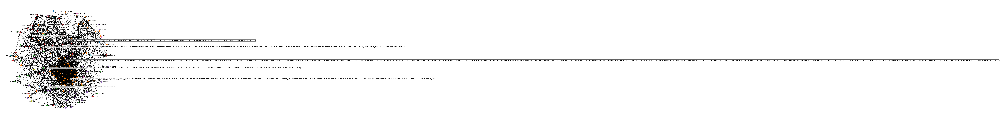

In [ ]:

import numpy as np
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=1800)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Perform community detection using the Louvain method (available in NetworkX)
communities = list(nx.algorithms.community.label_propagation.label_propagation_communities(G))

# Create a color map for communities
community_colors = {}
for i, community in enumerate(communities):
    for hero in community:
        community_colors[hero] = i

colors = [community_colors[node] for node in G.nodes()]

# Visualize the graph with communities and smaller label font size
plt.figure(figsize=(12, 12), dpi=200)  # Adjust figure size and DPI as needed
pos = nx.spring_layout(G, seed=42, k=0.9)  # Adjust the layout and 'k' for more space
nx.draw(G, pos, node_color=colors, with_labels=True, node_size=100, cmap=plt.get_cmap('tab20', len(communities)), font_size=9)  # Adjust font_size as needed
# Add community labels
for i, community in enumerate(communities):
    community_label = ', '.join(community)
    x, y = np.mean([pos[node] for node in community], axis=0)
    plt.text(x, y, f'Community {i+1}: {community_label}', fontsize=9, bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round'))
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=4800)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Perform community detection using the Louvain method (available in NetworkX)
communities = list(nx.algorithms.community.greedy_modularity_communities(G))

# Create a color map for communities
community_colors = {}
for i, community in enumerate(communities):
    for hero in community:
        community_colors[hero] = i

colors = [community_colors[node] for node in G.nodes()]

# Visualize the graph with communities and smaller label font size
plt.figure(figsize=(12, 12), dpi=200)  # Adjust figure size and DPI as needed
pos = nx.spring_layout(G, seed=42, k=0.9)  # Adjust the layout and 'k' for more space
nx.draw(G, pos, node_color=colors, with_labels=True, node_size=100, cmap=plt.get_cmap('tab20', len(communities)), font_size=9)  # Adjust font_size as needed
# Add community labels
for i, community in enumerate(communities):
    community_label = ', '.join(community)
    x, y = np.mean([pos[node] for node in community], axis=0)
    plt.text(x, y, f'Community {i+1}: {community_label}', fontsize=9, bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round'))
plt.show()


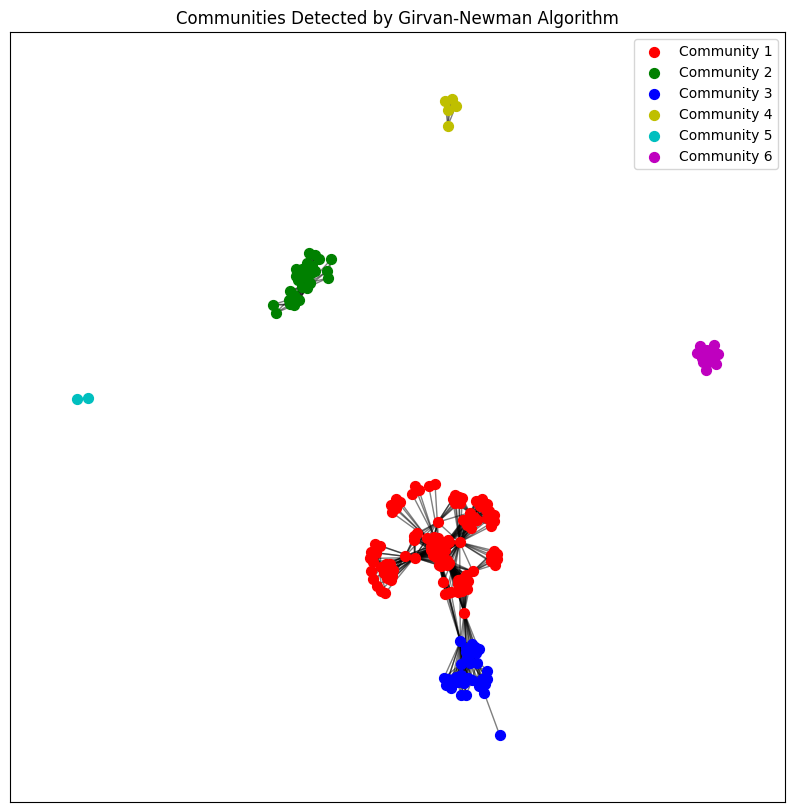

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Detect communities using Girvan-Newman algorithm
comp = nx.community.girvan_newman(G)

# Get the first set of communities
communities = next(comp)

# Convert communities from sets to lists
communities = [list(community) for community in communities]

# Visualize the communities
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, seed=42)
colors = ['r', 'g', 'b', 'y', 'c', 'm']  # Add more colors if needed
for i, community in enumerate(communities):
    nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=colors[i], node_size=50, label=f'Community {i + 1}')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Communities Detected by Girvan-Newman Algorithm")
plt.legend()
plt.show()


<ipython-input-39-a000d53b6316>:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


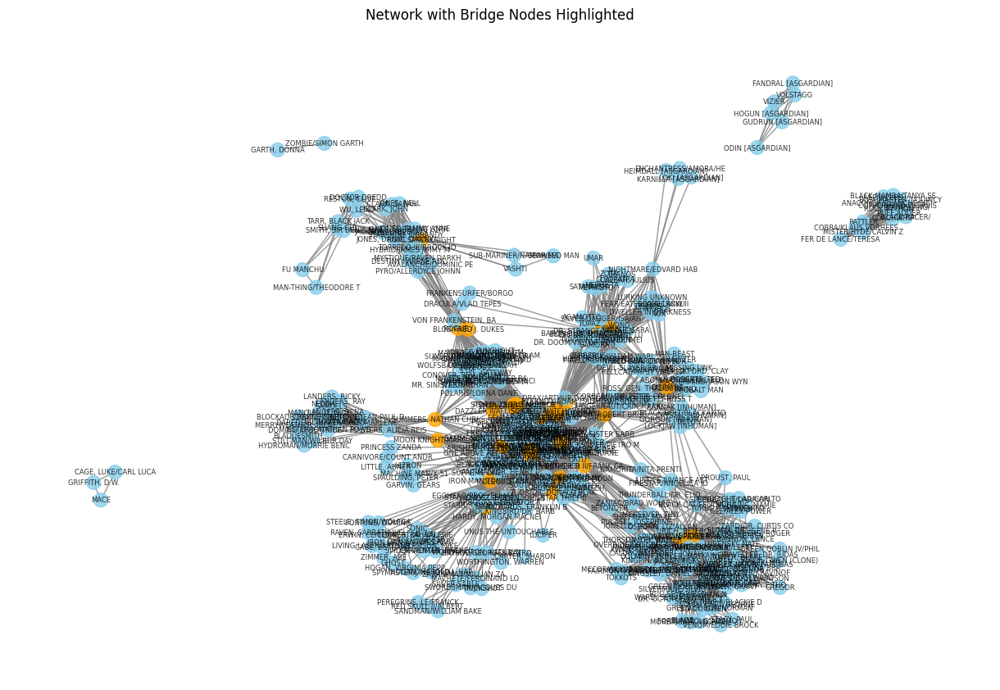

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=5000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Find nodes with high betweenness centrality
threshold = 0.02  # Adjust this threshold as needed
bridge_nodes = [node for node, centrality in betweenness_centrality.items() if centrality > threshold]

# Visualize the network with a customized layout and node colors
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42, k=0.15)  # Custom layout
node_color = ['orange' if node in bridge_nodes else 'skyblue' for node in G.nodes()]

# Draw the network, highlighting bridge nodes in a different color
nx.draw(G, pos, with_labels=True, font_size=6, node_size=150, node_color=node_color, edge_color='gray', alpha=0.8)
plt.title("Network with Bridge Nodes Highlighted")
plt.tight_layout()
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=5000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Find nodes with high betweenness centrality
threshold = 0.02  # Adjust this threshold as needed
bridge_nodes = [node for node, centrality in betweenness_centrality.items() if centrality > threshold]

# Print bridge nodes
print("Bridge Nodes:")
for node in bridge_nodes:
    print(node)


Bridge Nodes:
IRON MAN/TONY STARK 
ROM, SPACEKNIGHT
BLOB/FRED J. DUKES
ROGUE /
HULK/DR. ROBERT BRUC
SPIDER-MAN/PETER PAR
SILVER SURFER/NORRIN
HAWK
SCARLET WITCH/WANDA 
WOLVERINE/LOGAN 
PSYLOCKE/ELISABETH B
MARVEL GIRL/JEAN GRE
STORM/ORORO MUNROE S
ETERNITY/ADAM QADMON
ANGEL/WARREN KENNETH
THING/BENJAMIN J. GR
PUNISHER II/FRANK CA
BEAST/HENRY &HANK& P
CYCLOPS/SCOTT SUMMER
THOR/DR. DONALD BLAK
DR. STRANGE/STEPHEN 
WATSON-PARKER, MARY 
ICEMAN/ROBERT BOBBY 
DAZZLER II/ALLISON B
SUMMERS, NATHAN CHRI
MOON KNIGHT/MARC SPE
D'SPAYRE
CLEA


In [ ]:
import plotly.graph_objects as go

# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=1000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Find nodes with high betweenness centrality
threshold = 0.02  # Adjust this threshold as needed
bridge_nodes = [node for node, centrality in betweenness_centrality.items() if centrality > threshold]

# Create a subgraph focusing on bridge nodes and their immediate neighbors
subgraph_nodes = set(bridge_nodes)
for node in bridge_nodes:
    subgraph_nodes.update(list(G.neighbors(node)))

subgraph = G.subgraph(subgraph_nodes)

# Create Plotly figure for network visualization
pos = nx.spring_layout(subgraph, seed=42, k=0.15)
edge_x = []
edge_y = []
for edge in subgraph.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
node_text = []
for node in subgraph.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(node)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers+text',
    text=node_text,
    hoverinfo='text',
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Color',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Interactive Network Visualization with Plotly',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()


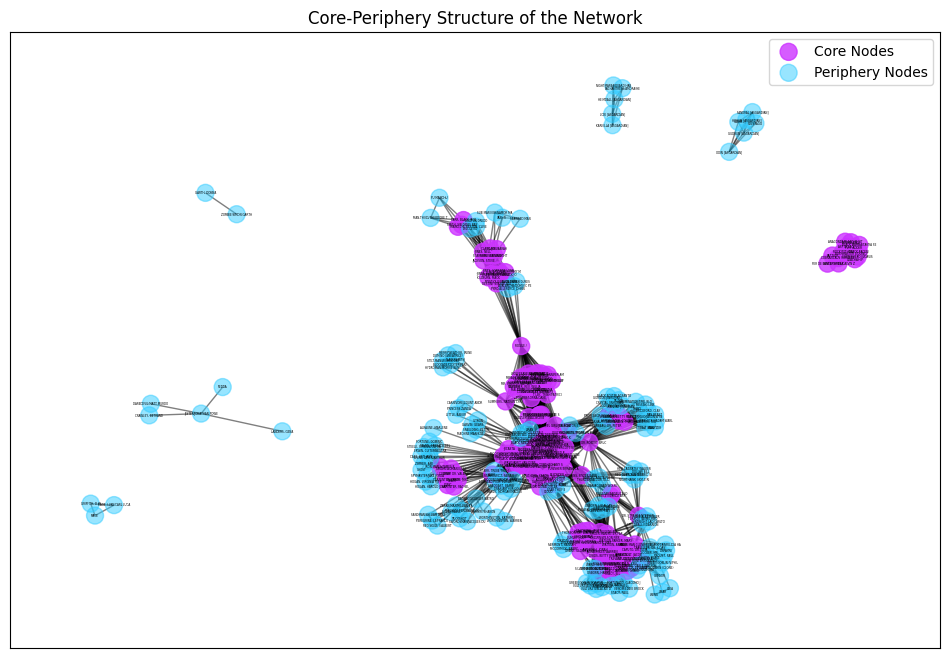

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=4000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute the degree centrality of nodes
degree_centrality = nx.degree_centrality(G)

# Define a threshold to identify core and periphery nodes
threshold = 0.03  # Adjust this threshold as needed

# Separate nodes into core and periphery based on degree centrality
core_nodes = [node for node, centrality in degree_centrality.items() if centrality >= threshold]
periphery_nodes = [node for node, centrality in degree_centrality.items() if centrality < threshold]

# Get positions for nodes
pos = nx.spring_layout(G, seed=42,k=0.1)

# Create a colormap for better visualization
cmap = plt.cm.cool

# Assign colors to nodes
core_colors = [cmap(0.8)] * len(core_nodes)
periphery_colors = [cmap(0.2)] * len(periphery_nodes)

# Draw the network with core and periphery nodes
plt.figure(figsize=(12, 8))

# Draw the core nodes
nx.draw_networkx_nodes(G, pos, nodelist=core_nodes, node_color=core_colors, node_size=150, alpha=0.8, label='Core Nodes')

# Draw the periphery nodes
nx.draw_networkx_nodes(G, pos, nodelist=periphery_nodes, node_color=periphery_colors, node_size=150, alpha=0.5, label='Periphery Nodes')

# Draw the edges
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Add labels to nodes
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=2)

# Add title and legend
plt.title('Core-Periphery Structure of the Network')
plt.legend()

# Show the plot
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=4000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute the degree centrality of nodes
degree_centrality = nx.degree_centrality(G)

# Define a threshold to identify core and periphery nodes
threshold = 0.03  # Adjust this threshold as needed

# Separate nodes into core and periphery based on degree centrality
core_nodes = [node for node, centrality in degree_centrality.items() if centrality >= threshold]
periphery_nodes = [node for node, centrality in degree_centrality.items() if centrality < threshold]

# Print the core nodes
print("Core Nodes:")
for node in core_nodes:
    print(node)

# Print the periphery nodes
print("\nPeriphery Nodes:")
for node in periphery_nodes:
    print(node)


Core Nodes:
BLACK PANTHER/T'CHAL
IRON MAN/TONY STARK 
IRON MAN IV/JAMES R.
TARR, BLACK JACK
SMITH, SIR DENIS NAY
SHANG-CHI
STARSHINE II/BRANDY 
ROM, SPACEKNIGHT
JACKSON, STEVE
MYSTIQUE/RAVEN DARKH
TORPEDO III/BROCK JO
ROGUE /
DESTINY II/IRENE ADL
HYBRID/JAMES JIMMY M
CLARK, SARAH
KILLBURN, MACK
JONES, TAMMY ANNE
JONES, LORRAINE LORR
JONES, NELL
JONES, DANIEL DANNY
CLARK, JOHN
NOVA/RICHARD RIDER
FIRESTAR/ANGELICA JO
SPEEDBALL/ROBBIE BAL
HULK/DR. ROBERT BRUC
NIGHT THRASHER/DUANE
SPIDER-MAN/PETER PAR
JUSTICE II/VANCE AST
TIGRA/GREER NELSON
WASP/JANET VAN DYNE 
GALACTUS/GALAN
MOCKINGBIRD/DR. BARB
SILVER SURFER/NORRIN
HAWK
LORD CHAOS
SCARLET WITCH/WANDA 
QUICKSILVER/PIETRO M
UATU
CAPTAIN AMERICA
THUNDERSTRIKE/ERIC K
WONDER MAN/SIMON WIL
DEATHLOK III/MICHAEL
OBLIVION
WOLVERINE/LOGAN 
SHE-HULK/JENNIFER WA
VISION 
PSYLOCKE/ELISABETH B
MARVEL GIRL/JEAN GRE
STORM/ORORO MUNROE S
ETERNITY/ADAM QADMON
KISMET/J'RIDIA STARD
IN-BETWEENER
MR. FANTASTIC/REED R
ANGEL/WARREN KENNETH
DEATH
MASTER ORDER
JUB

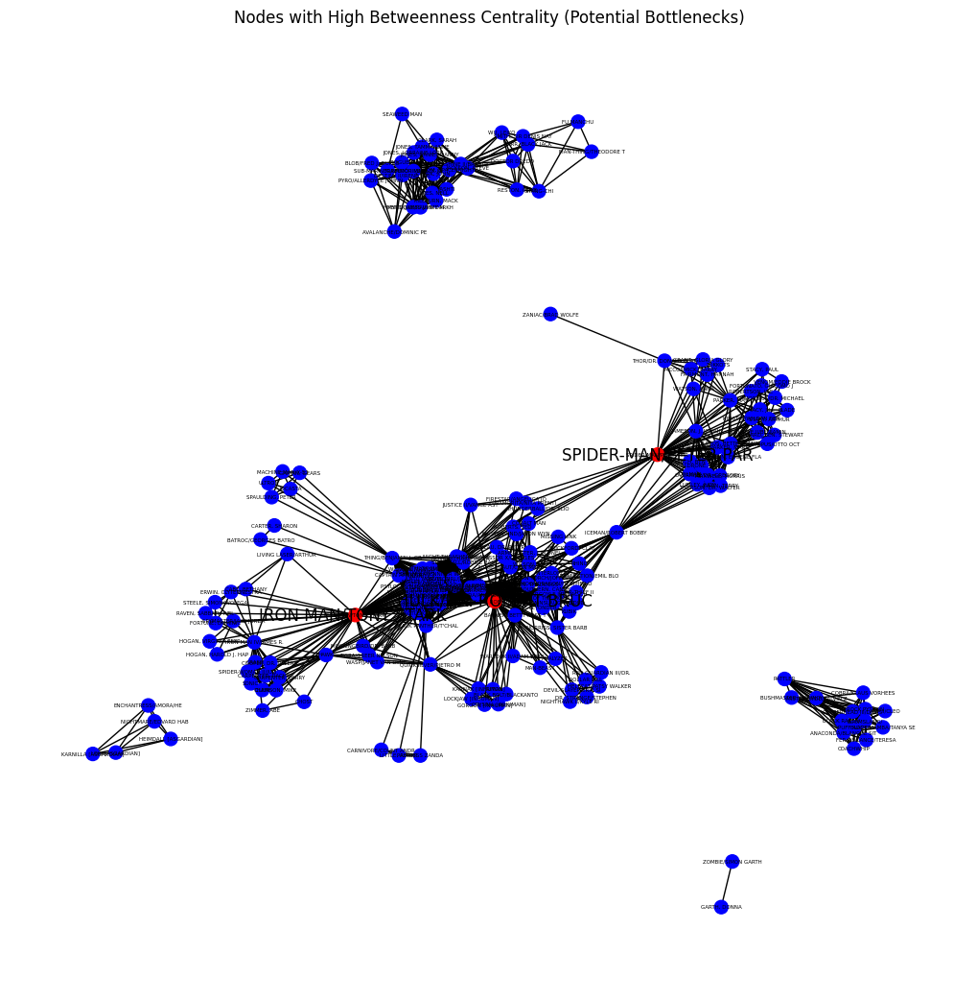

Nodes with high betweenness centrality (potential bottlenecks):
['IRON MAN/TONY STARK ', 'HULK/DR. ROBERT BRUC', 'SPIDER-MAN/PETER PAR']


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Find nodes with high betweenness centrality (potential bottlenecks)
threshold = 0.05  # Set a threshold for high betweenness centrality
bottlenecks = [node for node, centrality in betweenness.items() if centrality > threshold]

# Visualize the network with labeled bottleneck nodes
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, k=0.2)
node_colors = ['red' if node in bottlenecks else 'blue' for node in G.nodes()]
nx.draw(G, pos, with_labels=True, font_size=4, node_size=100, node_color=node_colors)
labels = {node: node if node in bottlenecks else '' for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=labels)
plt.title('Nodes with High Betweenness Centrality (Potential Bottlenecks)')
plt.show()

# Print identified bottleneck nodes
print("Nodes with high betweenness centrality (potential bottlenecks):")
print(bottlenecks)


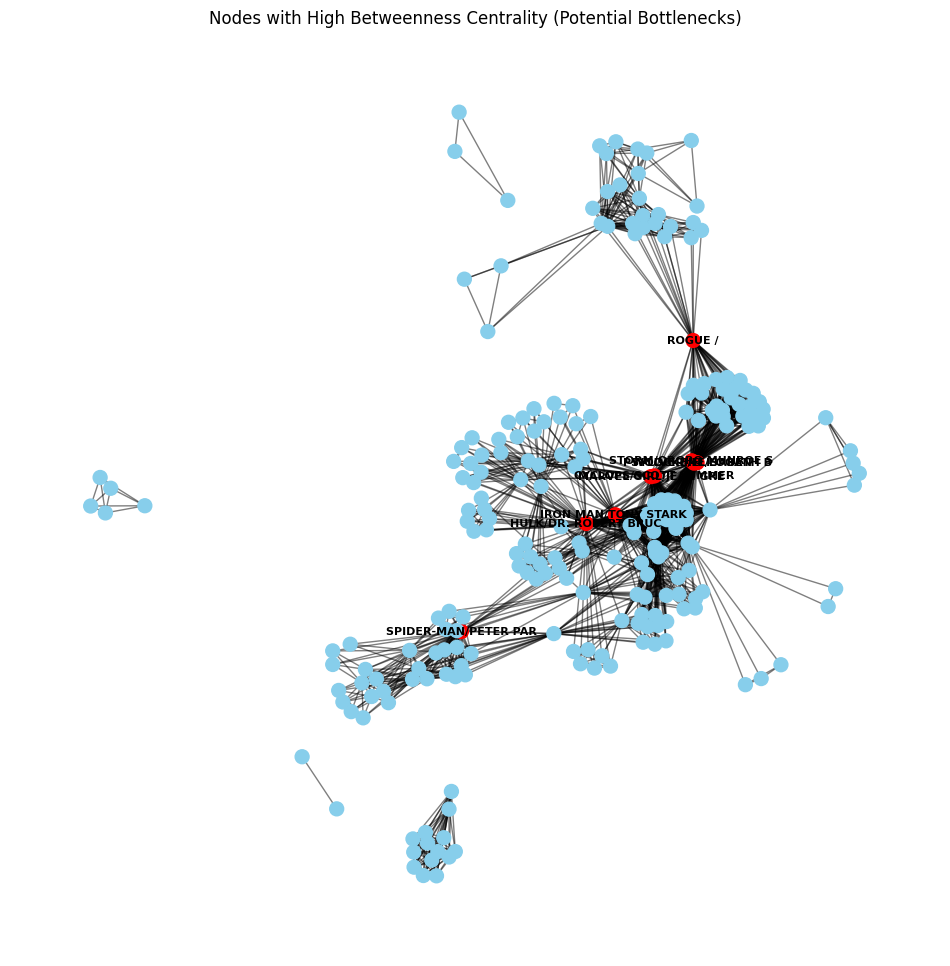

Nodes with high betweenness centrality (potential bottlenecks):
['IRON MAN/TONY STARK ', 'ROGUE /', 'HULK/DR. ROBERT BRUC', 'SPIDER-MAN/PETER PAR', 'WOLVERINE/LOGAN ', 'PSYLOCKE/ELISABETH B', 'MARVEL GIRL/JEAN GRE', 'STORM/ORORO MUNROE S', 'CYCLOPS/SCOTT SUMMER']


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Find nodes with high betweenness centrality (potential bottlenecks)
threshold = 0.05  # Set a threshold for high betweenness centrality
bottlenecks = [node for node, centrality in betweenness.items() if centrality > threshold]

# Visualize the network with labeled bottleneck nodes
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.2)
node_colors = ['red' if node in bottlenecks else 'skyblue' for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Show labels only for nodes with high betweenness centrality (in red)
red_node_labels = {node: node if node in bottlenecks else '' for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=red_node_labels, font_size=8, font_color='black', font_weight='bold')

plt.title('Nodes with High Betweenness Centrality (Potential Bottlenecks)')
plt.axis('off')
plt.show()

# Print identified bottleneck nodes
print("Nodes with high betweenness centrality (potential bottlenecks):")
print(bottlenecks)


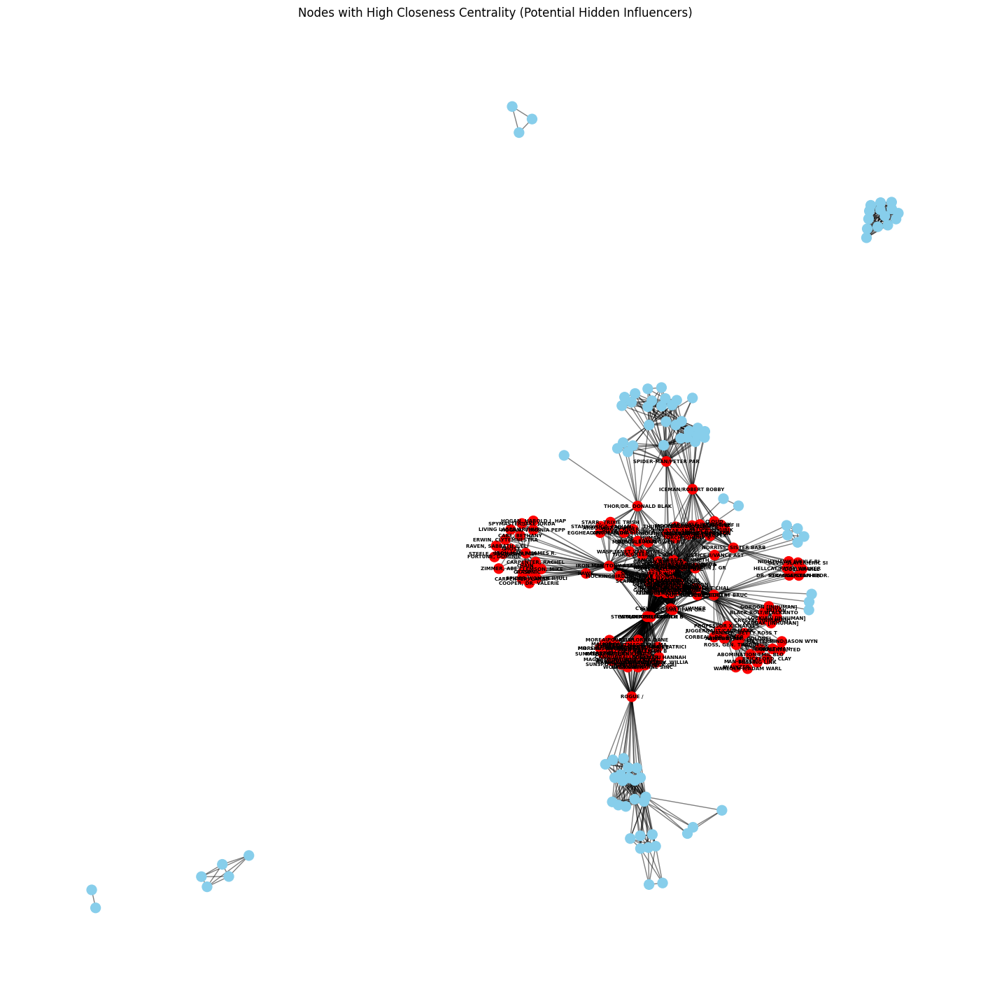

Nodes with high closeness centrality (potential hidden influencers):
["BLACK PANTHER/T'CHAL", 'STEELE, SIMON/WOLFGA', 'FORTUNE, DOMINIC', 'ERWIN, CLYTEMNESTRA', 'IRON MAN/TONY STARK ', 'IRON MAN IV/JAMES R.', 'RAVEN, SABBATH II/EL', 'GHOST', 'ZIMMER, ABE', 'ROGUE /', 'NOVA/RICHARD RIDER', 'FIRESTAR/ANGELICA JO', 'THUNDERBALL/DR. ELIO', 'NAMORITA/NITA PRENTI', 'SPEEDBALL/ROBBIE BAL', 'HULK/DR. ROBERT BRUC', 'NIGHT THRASHER/DUANE', 'SPIDER-MAN/PETER PAR', 'JUSTICE II/VANCE AST', 'TIGRA/GREER NELSON', 'WASP/JANET VAN DYNE ', 'GALACTUS/GALAN', 'MOCKINGBIRD/DR. BARB', 'SILVER SURFER/NORRIN', 'HAWK', 'LORD CHAOS', 'SCARLET WITCH/WANDA ', 'QUICKSILVER/PIETRO M', 'UATU', 'CAPTAIN AMERICA', 'THUNDERSTRIKE/ERIC K', 'WONDER MAN/SIMON WIL', 'DEATHLOK III/MICHAEL', 'OBLIVION', 'WOLVERINE/LOGAN ', 'SHE-HULK/JENNIFER WA', 'VISION ', 'PSYLOCKE/ELISABETH B', 'MARVEL GIRL/JEAN GRE', 'STORM/ORORO MUNROE S', 'ETERNITY/ADAM QADMON', "KISMET/J'RIDIA STARD", 'IN-BETWEENER', 'MR. FANTASTIC/REED R', 'ANGEL/WAR

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute closeness centrality for each node
closeness = nx.closeness_centrality(G)

# Find nodes with high closeness centrality (potential hidden influencers)
threshold = 0.3  # Set a threshold for high closeness centrality
hidden_influencers = [node for node, centrality in closeness.items() if centrality > threshold]

# Visualize the network with labeled hidden influencer nodes
plt.figure(figsize=(18, 18))
pos = nx.spring_layout(G, k=0.1)
node_colors = ['red' if node in hidden_influencers else 'skyblue' for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Show labels only for nodes with high closeness centrality (in red)
red_node_labels = {node: node if node in hidden_influencers else '' for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=red_node_labels, font_size=5, font_color='black', font_weight='bold')

plt.title('Nodes with High Closeness Centrality (Potential Hidden Influencers)')
plt.axis('off')
plt.show()

# Print identified hidden influencer nodes
print("Nodes with high closeness centrality (potential hidden influencers):")
print(hidden_influencers)


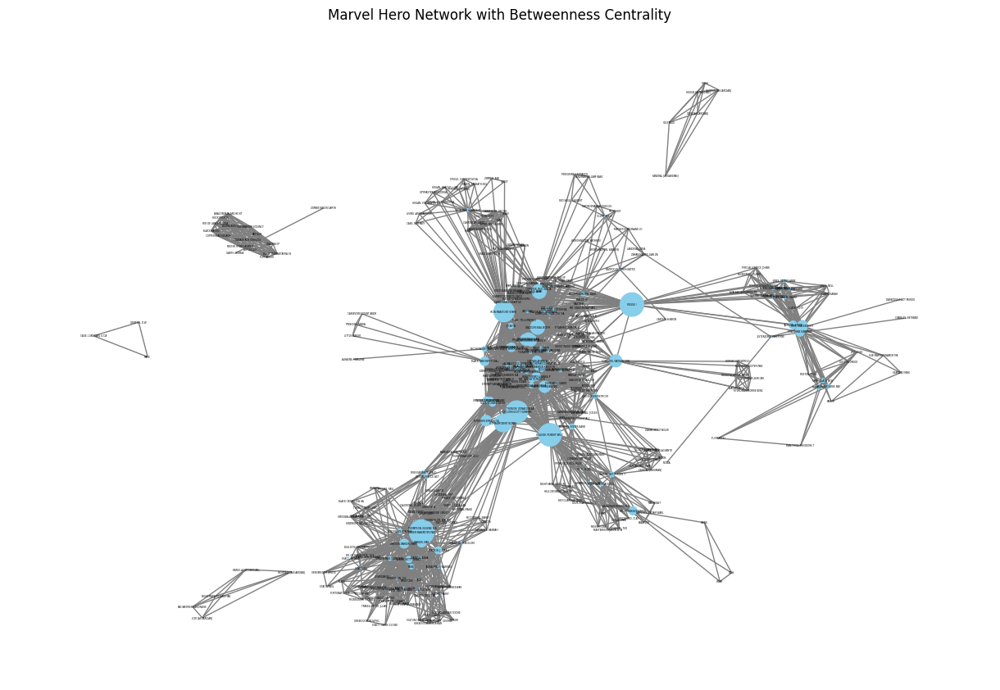

In [ ]:
# Load the hero network dataset (subset of 3000 rows)
file_path = '/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv'
hero_network = pd.read_csv(file_path, nrows=4000)

# Create a graph from the dataset
G = nx.from_pandas_edgelist(hero_network, 'hero1', 'hero2')

# Calculate betweenness centrality
betweenness_centralities = nx.betweenness_centrality(G)

# Create a list of betweenness centrality values for each node
node_sizes = [3000 * val for val in betweenness_centralities.values()]

# Draw the network with node sizes based on betweenness centrality
pos = nx.spring_layout(G, k=0.2)
plt.figure(figsize=(12, 8))
nx.draw(G, pos, with_labels=True, node_size=node_sizes,font_size=2, node_color='skyblue', edge_color='gray')
plt.title('Marvel Hero Network with Betweenness Centrality')
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality and betweenness centrality for each node
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)

# Combine these centrality measures to assess social capital
social_capital = {node: degree_centrality[node] + betweenness_centrality[node] for node in G.nodes()}

# Sort nodes by their social capital
sorted_nodes = sorted(social_capital, key=social_capital.get, reverse=True)

# Print top nodes with the highest social capital
top_nodes = sorted_nodes[:10]  # Top 10 nodes with highest social capital
print("Top nodes with the highest social capital:")
for node in top_nodes:
    print(f"{node}: {social_capital[node]}")


Top nodes with the highest social capital:
HULK/DR. ROBERT BRUC: 0.5466673872110631
IRON MAN/TONY STARK : 0.44326163489008646
SPIDER-MAN/PETER PAR: 0.35300745155832913
ANGEL/WARREN KENNETH: 0.26902047472768864
ANDROMEDA/ANDROMEDA : 0.26902047472768864
BEAST/HENRY &HANK& P: 0.26902047472768864
MR. FANTASTIC/REED R: 0.24944376458263598
THING/BENJAMIN J. GR: 0.245273631840796
NOVA/RICHARD RIDER: 0.2352020688303627
SPEEDBALL/ROBBIE BAL: 0.2352020688303627


Top nodes with the highest social capital:
HULK/DR. ROBERT BRUC: 0.5466673872110631
IRON MAN/TONY STARK : 0.44326163489008646
SPIDER-MAN/PETER PAR: 0.35300745155832913
ANGEL/WARREN KENNETH: 0.26902047472768864
ANDROMEDA/ANDROMEDA : 0.26902047472768864
BEAST/HENRY &HANK& P: 0.26902047472768864
MR. FANTASTIC/REED R: 0.24944376458263598
THING/BENJAMIN J. GR: 0.245273631840796
NOVA/RICHARD RIDER: 0.2352020688303627
SPEEDBALL/ROBBIE BAL: 0.2352020688303627


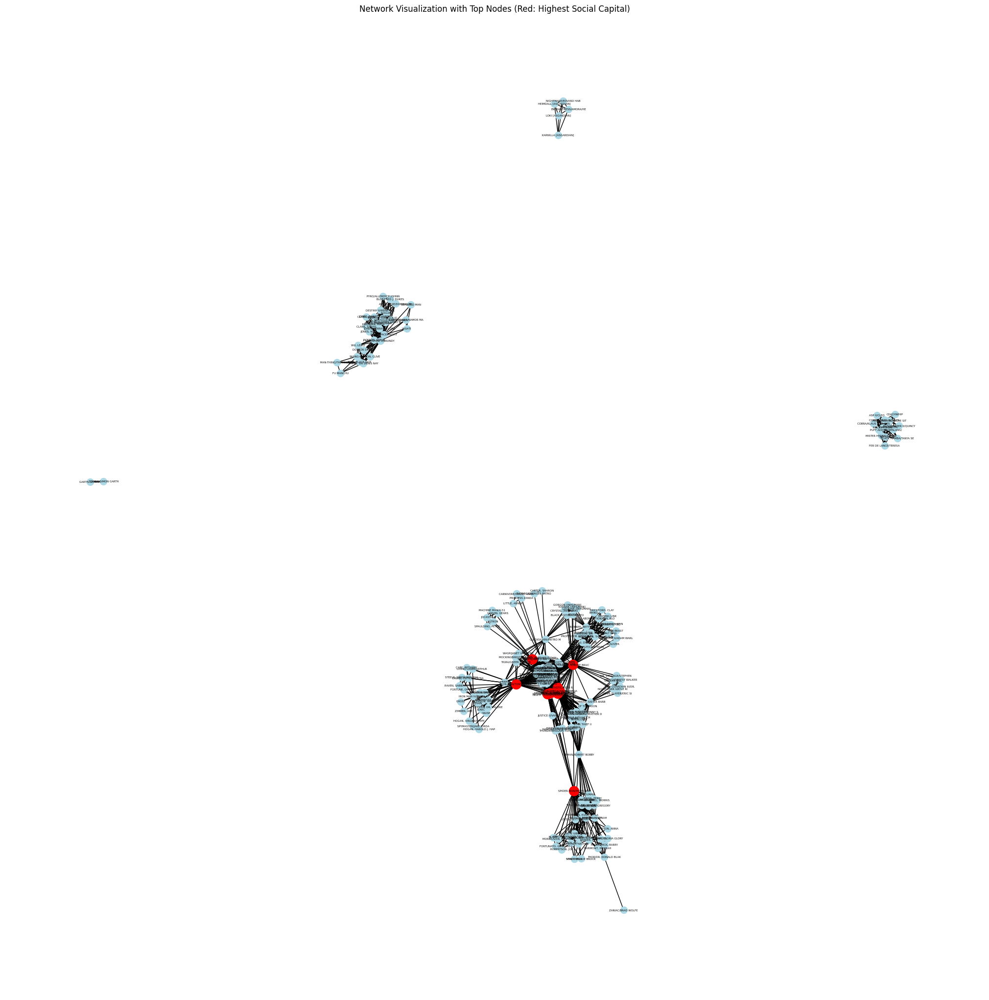

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Calculate degree centrality and betweenness centrality for each node
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)

# Combine these centrality measures to assess social capital
social_capital = {node: degree_centrality[node] + betweenness_centrality[node] for node in G.nodes()}

# Sort nodes by their social capital
sorted_nodes = sorted(social_capital, key=social_capital.get, reverse=True)

# Print top nodes with the highest social capital
top_nodes = sorted_nodes[:10]  # Top 10 nodes with highest social capital
print("Top nodes with the highest social capital:")
for node in top_nodes:
    print(f"{node}: {social_capital[node]}")

# Create a subgraph of top nodes
top_subgraph = G.subgraph(top_nodes)

# Draw the entire network
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_color='lightblue', with_labels=True, font_size=4, node_size=100)

# Highlight top nodes with red color
nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_color='red', node_size=200)

plt.title("Network Visualization with Top Nodes (Red: Highest Social Capital)")
plt.show()


Top nodes with the highest criticality:
LITTLE, ABNER: 0
PRINCESS ZANDA: 0
STEELE, SIMON/WOLFGA: 0
FORTUNE, DOMINIC: 0
ERWIN, CLYTEMNESTRA: 0
IRON MAN/TONY STARK : 0
IRON MAN IV/JAMES R.: 0
RAVEN, SABBATH II/EL: 0
CARNIVORE/COUNT ANDR: 0
GHOST: 0


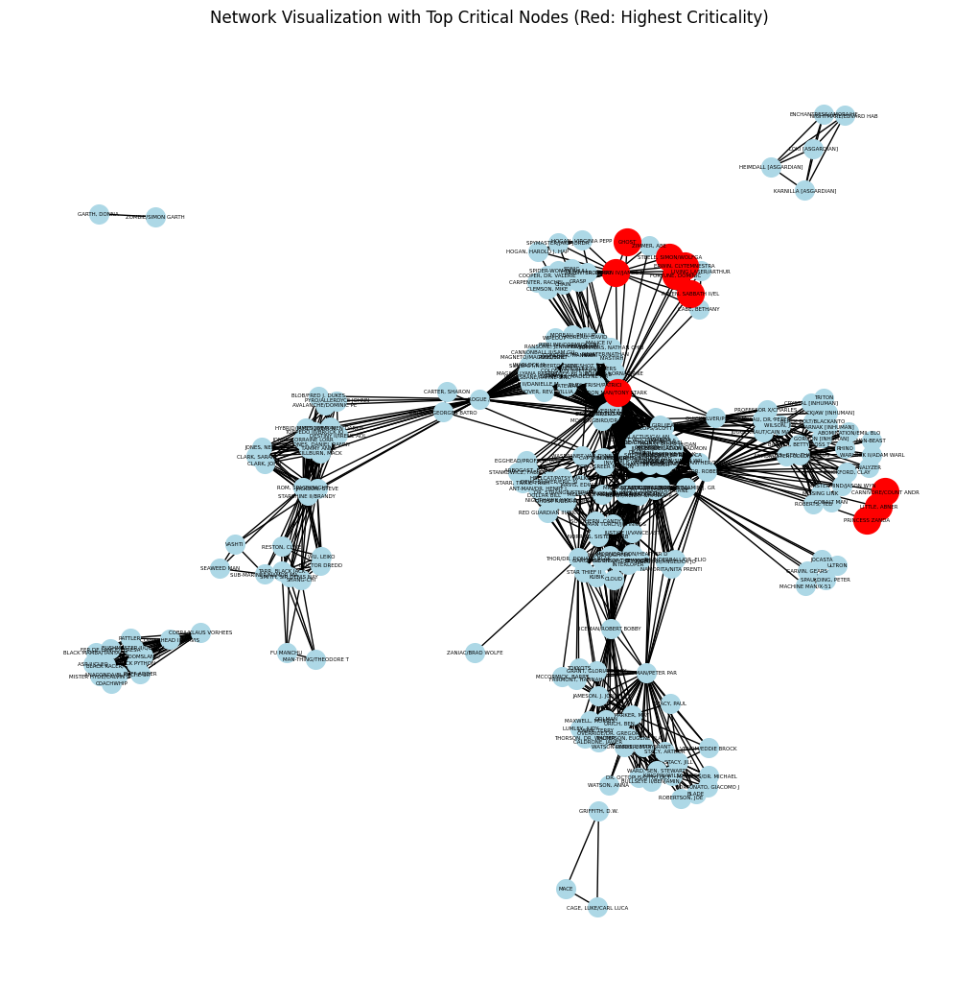

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Function to measure the impact on connectivity after node removal
def measure_connectivity(graph):
    initial_connectivity = nx.number_connected_components(graph)

    # Find the criticality of each node
    node_criticality = {}
    for node in graph.nodes():
        temp_graph = graph.copy()
        temp_graph.remove_node(node)
        connectivity = nx.number_connected_components(temp_graph)
        node_criticality[node] = initial_connectivity - connectivity

    return node_criticality

# Calculate the criticality of each hero
node_criticality = measure_connectivity(G)

# Sort nodes by their criticality
sorted_nodes = sorted(node_criticality, key=node_criticality.get, reverse=True)

# Print top nodes with the highest criticality
top_nodes = sorted_nodes[:10]  # Top 10 nodes with highest criticality
print("Top nodes with the highest criticality:")
for node in top_nodes:
    print(f"{node}: {node_criticality[node]}")

# Visualize the network with the top critical nodes highlighted
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, seed=100, k=0.2)
nx.draw(G, pos, node_color='lightblue', with_labels=True, font_size=4, node_size=200)

# Highlight top critical nodes with red color
nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_color='red', node_size=400)

plt.title("Network Visualization with Top Critical Nodes (Red: Highest Criticality)")
plt.show()


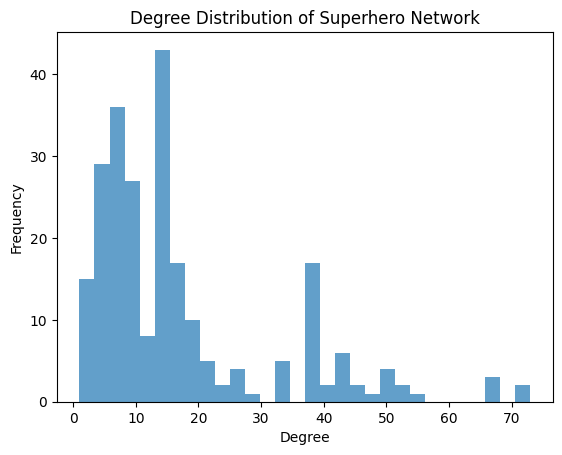

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)  # Replace 'your_dataset.csv' with your file

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Get degrees of all nodes
degrees = [deg for node, deg in G.degree()]

# Plot degree distribution
plt.hist(degrees, bins=30, alpha=0.7)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of Superhero Network')
plt.show()


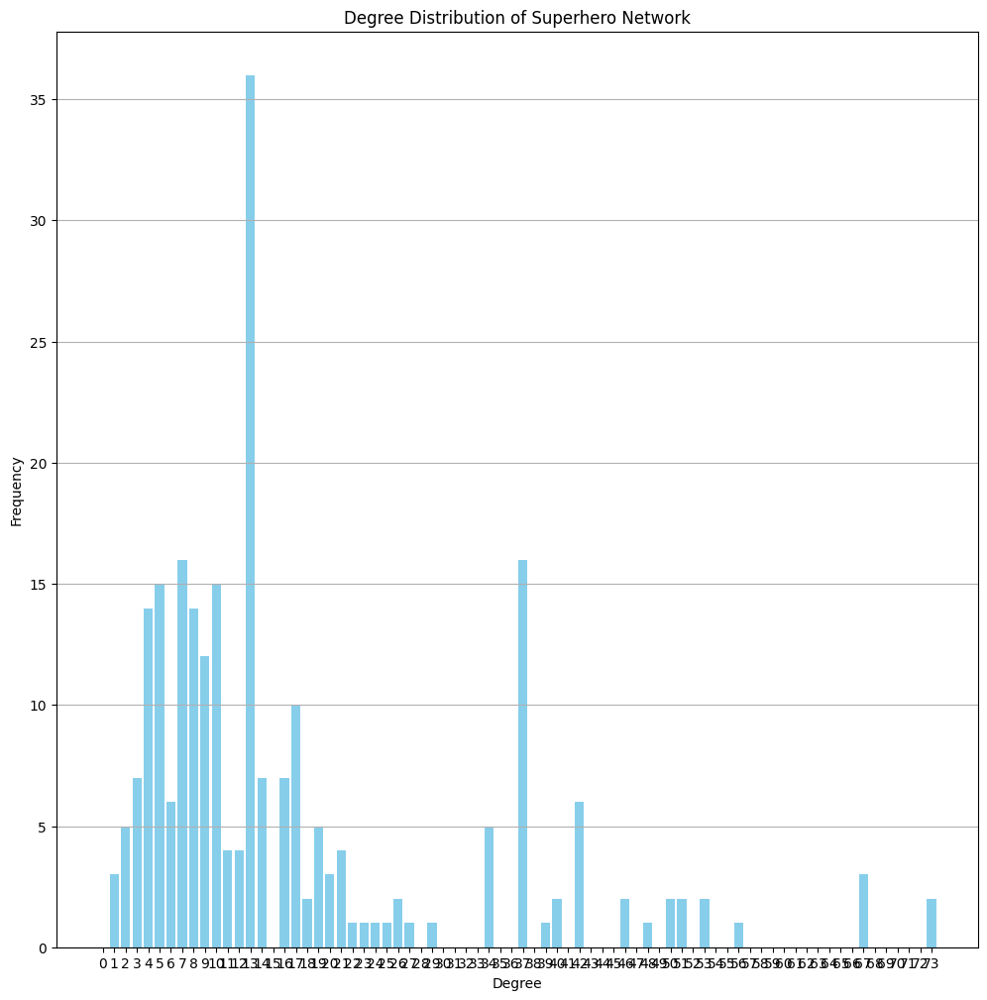

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=3000)  # Replace 'your_dataset.csv' with your file

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Get degrees of all nodes
degrees = [deg for node, deg in G.degree()]

# Calculate degree frequency
degree_freq = nx.degree_histogram(G)
degrees = range(len(degree_freq))

# Plot degree distribution as a bar graph
plt.figure(figsize=(12, 12))
plt.bar(degrees, degree_freq, width=0.8, color='skyblue')
plt.title('Degree Distribution of Superhero Network')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.xticks(degrees)
plt.grid(axis='y')
plt.show()


In [ ]:
import pandas as pd
import networkx as nx

# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv')

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Print total number of nodes and edges
print(f"Total number of nodes: {G.number_of_nodes()}")
print(f"Total number of edges: {G.number_of_edges()}")


Total number of nodes: 6426
Total number of edges: 167219


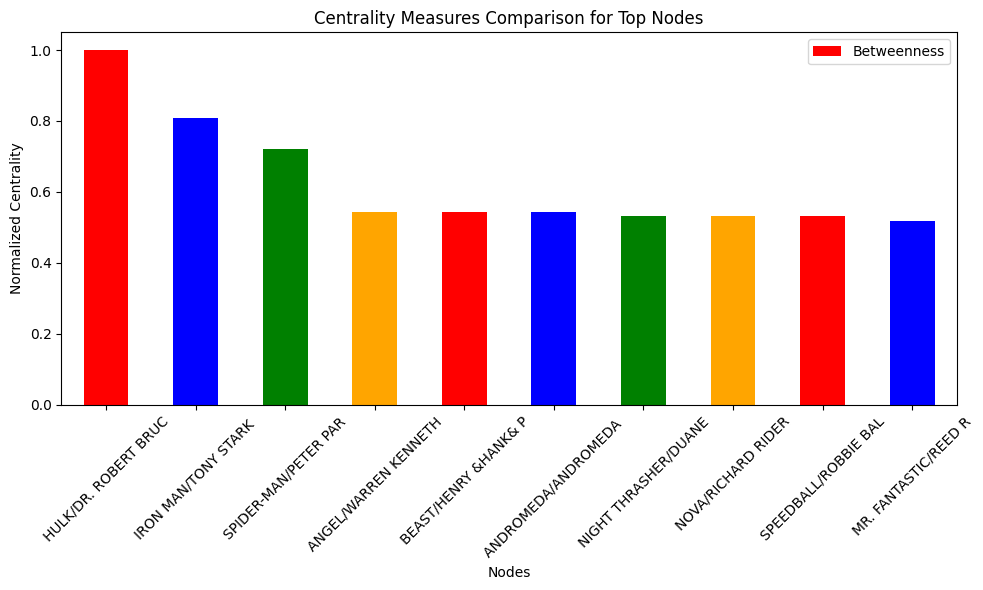

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute different centrality measures
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
degree = dict(G.degree())

# Combine centrality measures into a DataFrame
centrality_df = pd.DataFrame({
    'Betweenness Centrality': pd.Series(betweenness),
    'Closeness Centrality': pd.Series(closeness),
    'Degree Centrality': pd.Series(degree)
})

# Normalize centrality measures for fair comparison
centrality_df = (centrality_df - centrality_df.min()) / (centrality_df.max() - centrality_df.min())

# Average centrality measures for each node
centrality_df['Average Centrality'] = centrality_df.mean(axis=1)

# Sort nodes based on average centrality
sorted_nodes = centrality_df['Average Centrality'].sort_values(ascending=False)

# Select the top N nodes for comparison
top_n = 10  # Change this value to select more or fewer nodes for comparison
top_nodes = sorted_nodes.head(top_n)

# Plotting the comparison of centrality measures for top nodes
plt.figure(figsize=(10, 6))
top_nodes.plot(kind='bar', color=['red', 'blue', 'green', 'orange'])
plt.title('Centrality Measures Comparison for Top Nodes')
plt.xlabel('Nodes')
plt.ylabel('Normalized Centrality')
plt.xticks(rotation=45)
plt.legend(['Betweenness', 'Closeness', 'Degree', 'Average'])
plt.tight_layout()
plt.show()


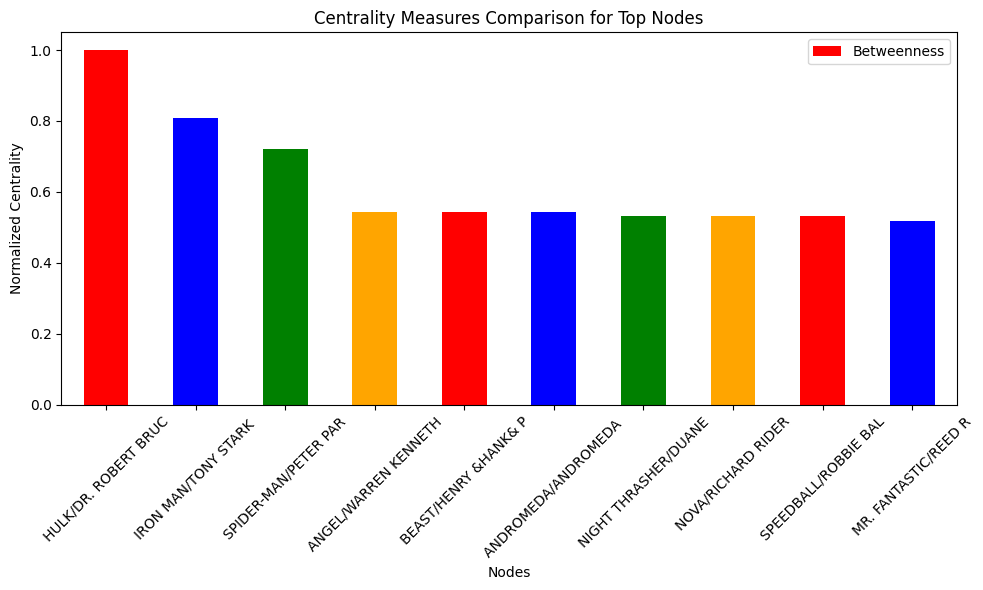

In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute different centrality measures
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
degree = dict(G.degree())

# Combine centrality measures into a DataFrame
centrality_df = pd.DataFrame({
    'Betweenness Centrality': pd.Series(betweenness),
    'Closeness Centrality': pd.Series(closeness),
    'Degree Centrality': pd.Series(degree)
})

# Normalize centrality measures for fair comparison
centrality_df = (centrality_df - centrality_df.min()) / (centrality_df.max() - centrality_df.min())

# Average centrality measures for each node
centrality_df['Average Centrality'] = centrality_df.mean(axis=1)

# Sort nodes based on average centrality
sorted_nodes = centrality_df['Average Centrality'].sort_values(ascending=False)

# Select the top N nodes for comparison
top_n = 10  # Change this value to select more or fewer nodes for comparison
top_nodes = sorted_nodes.head(top_n)

# Plotting the comparison of centrality measures for top nodes
plt.figure(figsize=(10, 6))
top_nodes.plot(kind='bar', color=['red', 'blue', 'green', 'orange'])
plt.title('Centrality Measures Comparison for Top Nodes')
plt.xlabel('Nodes')
plt.ylabel('Normalized Centrality')
plt.xticks(rotation=45)
plt.legend(['Betweenness', 'Closeness', 'Degree', 'Average'])
plt.tight_layout()
plt.show()


In [ ]:
# Load data from the CSV file
data = pd.read_csv('/content/my_drive/MyDrive/kaggle/marveldata/hero-network.csv', nrows=2000)

# Create a graph using NetworkX
G = nx.Graph()

# Add nodes and edges to the graph
for _, row in data.iterrows():
    G.add_node(row['hero1'])
    G.add_node(row['hero2'])
    G.add_edge(row['hero1'], row['hero2'])

# Compute different centrality measures
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
degree = nx.degree_centrality(G)

# Compare the centrality measures for each node
nodes = G.nodes()
for node in nodes:
    print(f"Node: {node}")
    print(f"Betweenness Centrality: {betweenness[node]}")
    print(f"Closeness Centrality: {closeness[node]}")
    print(f"Degree Centrality: {degree[node]}")
    print("\n")

Node: LITTLE, ABNER
Betweenness Centrality: 0.0
Closeness Centrality: 0.2560672933301888
Degree Centrality: 0.014925373134328358


Node: PRINCESS ZANDA
Betweenness Centrality: 0.0
Closeness Centrality: 0.2560672933301888
Degree Centrality: 0.014925373134328358


Node: BLACK PANTHER/T'CHAL
Betweenness Centrality: 0.02208955223880597
Closeness Centrality: 0.3845349523568598
Degree Centrality: 0.1990049751243781


Node: STEELE, SIMON/WOLFGA
Betweenness Centrality: 0.0
Closeness Centrality: 0.270734632327622
Degree Centrality: 0.02487562189054726


Node: FORTUNE, DOMINIC
Betweenness Centrality: 0.0
Closeness Centrality: 0.270734632327622
Degree Centrality: 0.02487562189054726


Node: ERWIN, CLYTEMNESTRA
Betweenness Centrality: 9.950248756218905e-05
Closeness Centrality: 0.27203311977283845
Degree Centrality: 0.03482587064676617


Node: IRON MAN/TONY STARK 
Betweenness Centrality: 0.1348039234473004
Closeness Centrality: 0.41552311701565436
Degree Centrality: 0.30845771144278605


Node: IRO